# ATAC annotation using Scanpy

In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp

from matplotlib import colors

import os
import anndata

In [2]:
sc.logging.print_header()

scanpy==1.7.2 anndata==0.7.6 umap==0.5.1 numpy==1.20.3 scipy==1.7.1 pandas==1.2.5 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.6 louvain==0.7.0


In [3]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=False,
                     color_map="YlGnBu", format='pdf', transparent=False,
                    ipython_format='png2x', figsize=(8,8))

In [4]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,3))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [5]:
os.getcwd()

'/home/jovyan/project/notebooks/s1d2_analysis/final_notebooks'

In [6]:
os.chdir('/home/jovyan/project/s1d2_data/atac_files/')

## Load data

In [7]:
# Load data preprocessed with Signac
adata_atac = sc.read_h5ad('s1d2_adata_geneAct.h5ad')

In [8]:
adata_atac

AnnData object with n_obs × n_vars = 7854 × 19039
    obs: 'nCount_peaks', 'atac_fragments', 'TSS.enrichment', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal'
    uns: 'peak_names'
    obsm: 'lsi_full', 'lsi_red', 'peaks', 'umap'

**ATAC Marker genes**

In [9]:
# for ATAC
marker_genes = {
    'CD14+ Mono': ['TREM1', 'FPR1'],
    'CD16+ Mono': ['LYN', 'TCF7L2'],
    'ID2-hi myeloid prog': ['KLF4'],
    'cDC2': ['TREM1', 'DMXL2'], # Note: DMXL2 should be negative
    'Reticulocyte': ['GATA1', 'HBA1', 'SLC4A1', 'SLC25A37', 'KLF1'],
    'Erythroblast': ['GATA1', 'MKI67'],
    'Proerythroblast': ['GATA2', 'SYNGR1'],
    'NK': ['CD160', 'GNLY', 'GRIK4', 'CD247'],
    'ILC': ['SPON2', 'GZMB', 'PRF1'], # Note CD69 should be negative
    'Lymph prog': ['MME', 'IGLL1', 'VPREB1', 'CD79B'],
    'Naive CD20+ B': ['MS4A1', 'LYN', 'CD74', 'BLK'],
    'B1 B': ['ITGB1', 'MS4A1', 'DUSP22', 'EPHA4'],
    'Transitional B': ['MME', 'CD38', 'CD24'],
    'Plasma cells': ['DUSP22', 'FNDC3B'],
    'CD4+ T activated': ['JAKMIP1', 'C4orf50'],
    'CD4+ T naive': [ 'BCL11B', 'BACH2', 'JAKMIP1', 'C4orf50'], # Note JAKMIP1 and C4orf50 are negative markers
    'CD8+ T': ['CD8A', 'CD8B'],
    'pDCs': ['PTPRS', 'TCF4', 'KCNN3', 'DUSP22'],
    'G/M prog': ['MPO','NT5DC3'],
    'HSC': ['PRDM16', 'MTRNR2L1'],
    'MK/E prog': ['DNAJC6']
}

## Clustering

Choose the reduced set of LSI components stored in adata.obsm.lsi_red and cluster on various resolutions.

In [10]:
sc.pp.neighbors(adata_atac, use_rep = 'lsi_red')

In [11]:
sc.tl.leiden(adata_atac, resolution=0.3, key_added='leiden_res0.3')
sc.tl.leiden(adata_atac, resolution=0.5, key_added='leiden_res0.5')
sc.tl.leiden(adata_atac, resolution=0.8, key_added='leiden_res0.8')
sc.tl.leiden(adata_atac, resolution=1, key_added='leiden_res1')

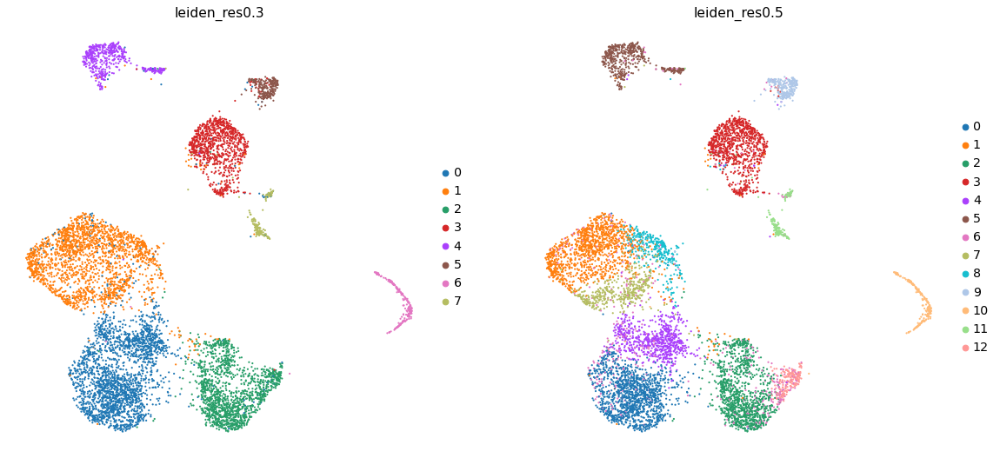

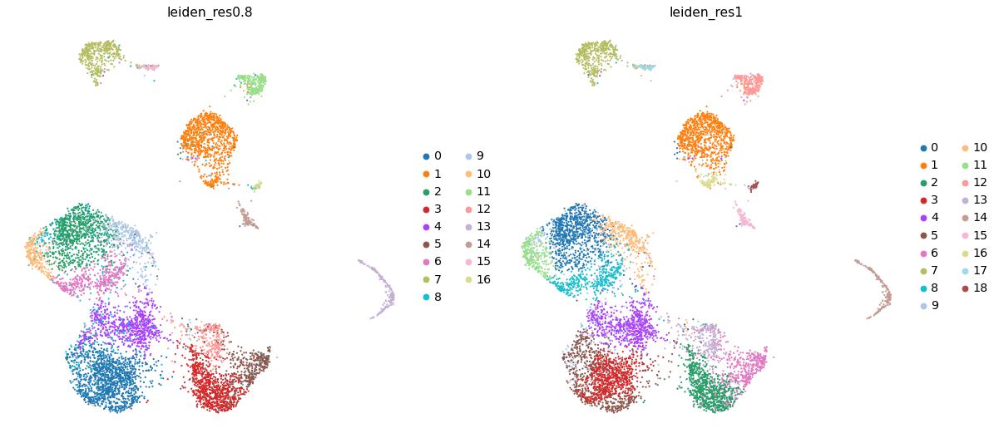

In [12]:
sc.pl.umap(adata_atac, color=['leiden_res0.3', 'leiden_res0.5'])
sc.pl.umap(adata_atac, color=['leiden_res0.8', 'leiden_res1'])

Choose rather coarse resolution that captures the main clusters (here: 0.3)

## QC and marker gene overview

In [13]:
# Select column that should be visualized
leiden_clus_col = 'leiden_res0.3'
# Name for added ranked genes per group
rank_id = 'rank_genes_res0.3'

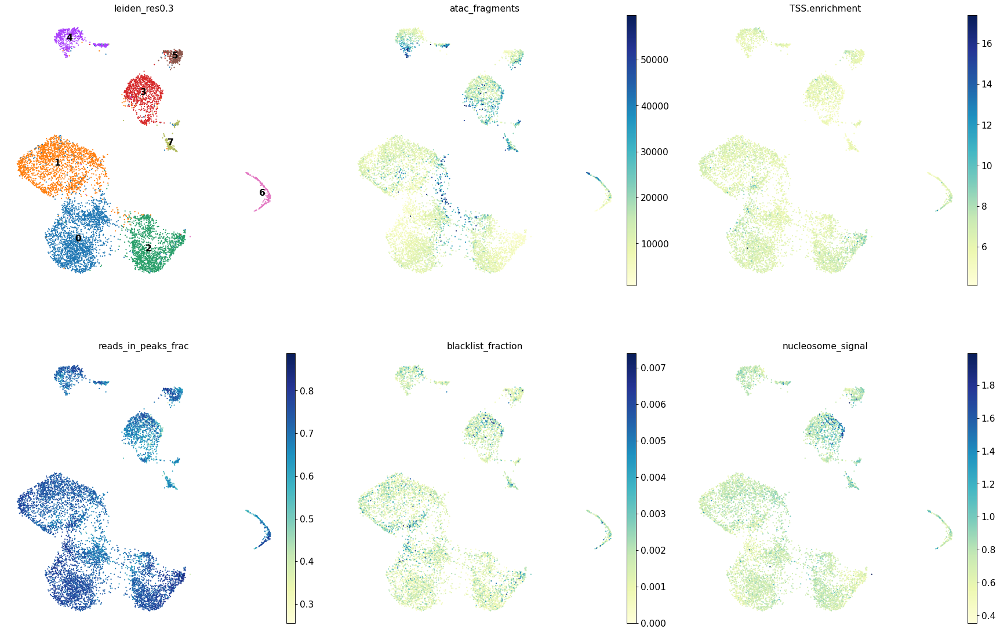

In [14]:
sc.pl.umap(adata_atac, color=[leiden_clus_col, 'atac_fragments', 'TSS.enrichment',
                              'reads_in_peaks_frac','blacklist_fraction','nucleosome_signal'],
          legend_loc = 'on data',
          ncols=3)

In [15]:
sc.tl.rank_genes_groups(adata_atac,
                        groupby= leiden_clus_col,
                        key_added = rank_id)

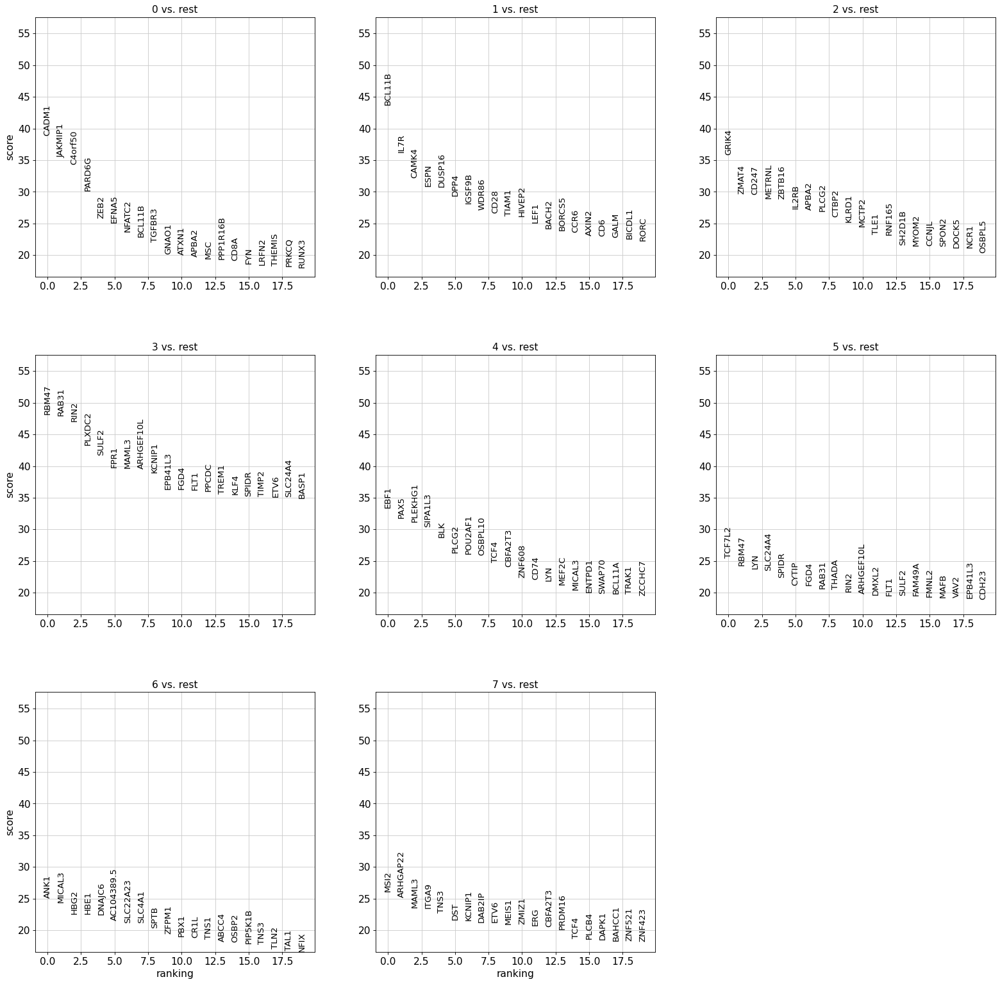

In [16]:
sc.pl.rank_genes_groups(adata_atac, key = rank_id, ncols=3, fontsize=12)

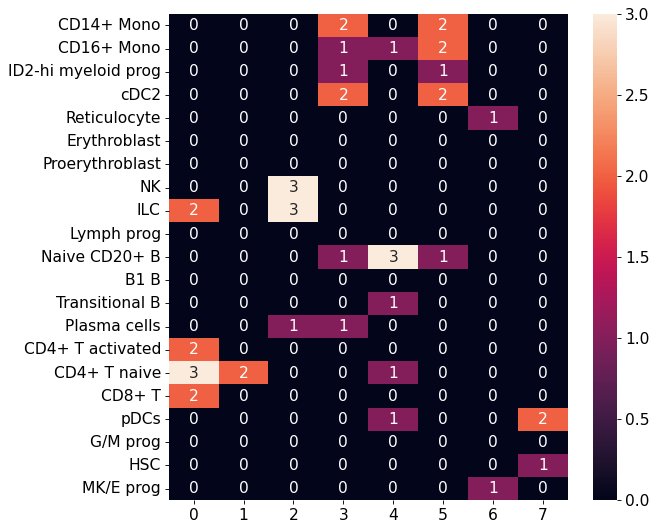

In [17]:
sns.heatmap(sc.tl.marker_gene_overlap(adata_atac,
                                      reference_markers=marker_genes,
                                      key= rank_id), annot=True)

plt.show()

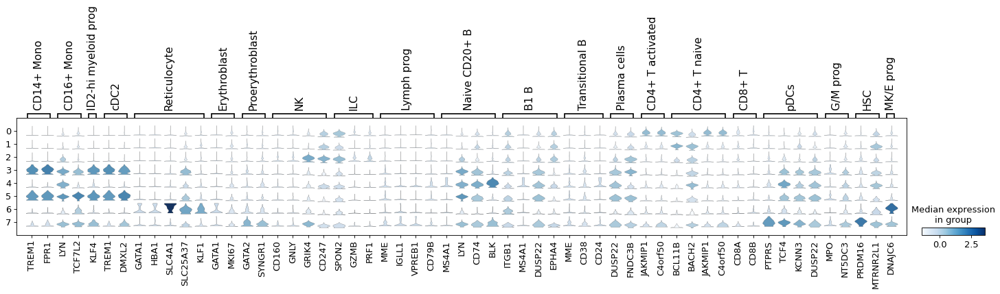

In [18]:
# Reduce to marker genes in gene activity matrix
filt_marker_genes = dict()
for key,val in marker_genes.items():
    filt_vals = [i for i in val if i in adata_atac.var_names]
    filt_marker_genes[key] = filt_vals

# Scale and plot
adata_plot = adata_atac.copy()
sc.pp.scale(adata_plot, max_value=5)
    
sc.pl.stacked_violin(adata_plot, var_names = filt_marker_genes,
                     groupby= leiden_clus_col,
                     use_raw=False)

In [19]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

### Plot marker genes

Check whether marker gene expression gives hint to subclusters of initial clusters.

Some marker genes are negative: DMXL2 for cDC2; CD69 for ILCs; JAKMIP1 and C4orf50 for naive T cells.

Due to the sparsity of the ATAC data, increased gene activity is not always very obivious. Try to keep keep clear markers for other celltypes in mind.

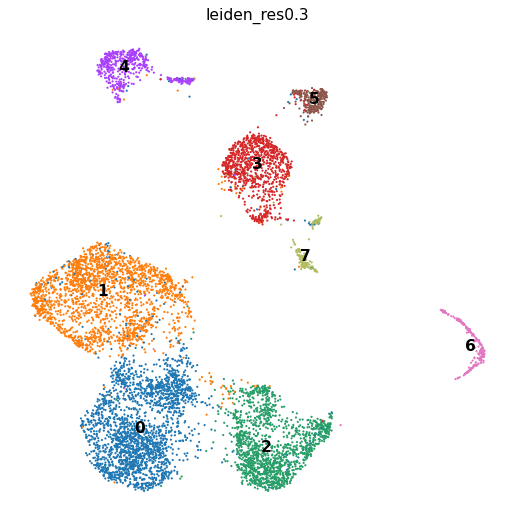

In [20]:
sc.pl.umap(adata_atac, color='leiden_res0.3', legend_loc='on data')

Cluster: CD14+ Mono


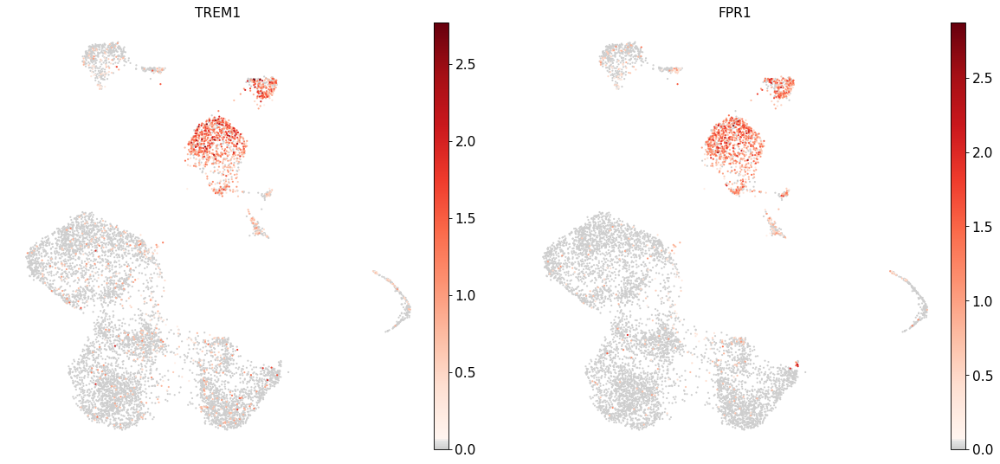

Cluster: CD16+ Mono


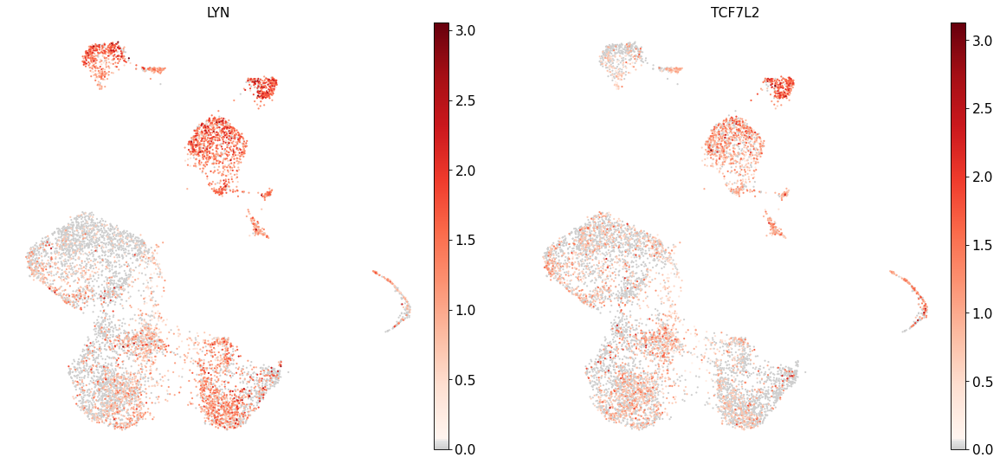

Cluster: ID2-hi myeloid prog


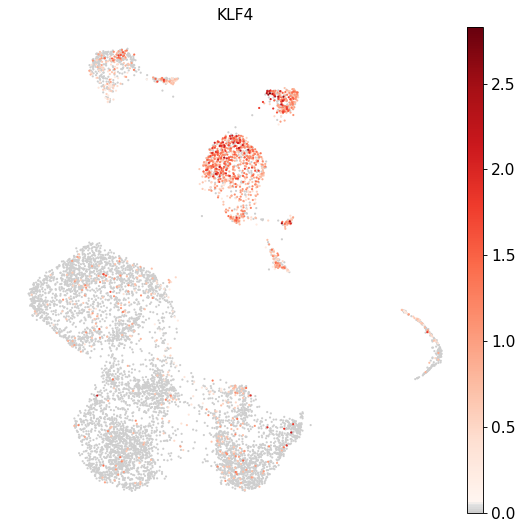

Cluster: cDC2


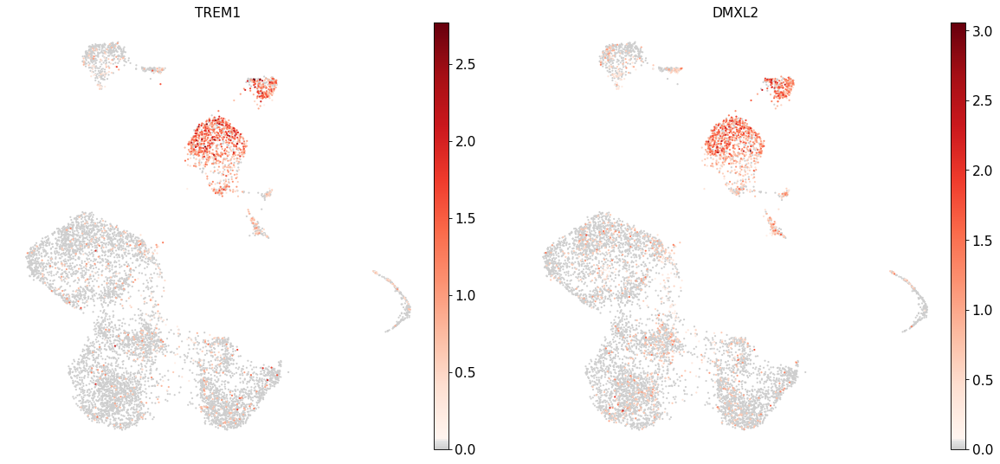

Cluster: Reticulocyte


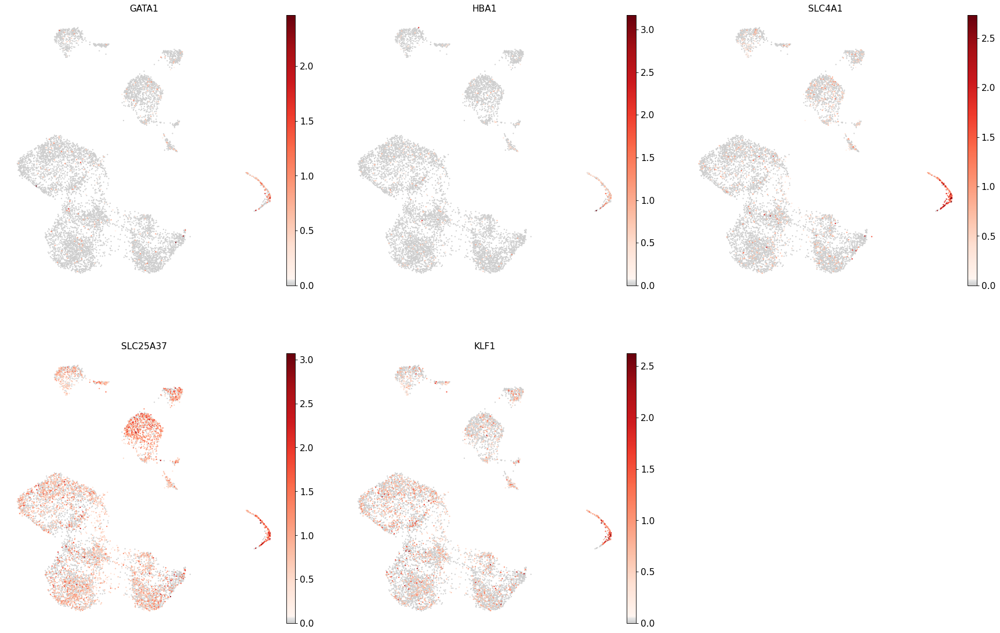

Cluster: Erythroblast


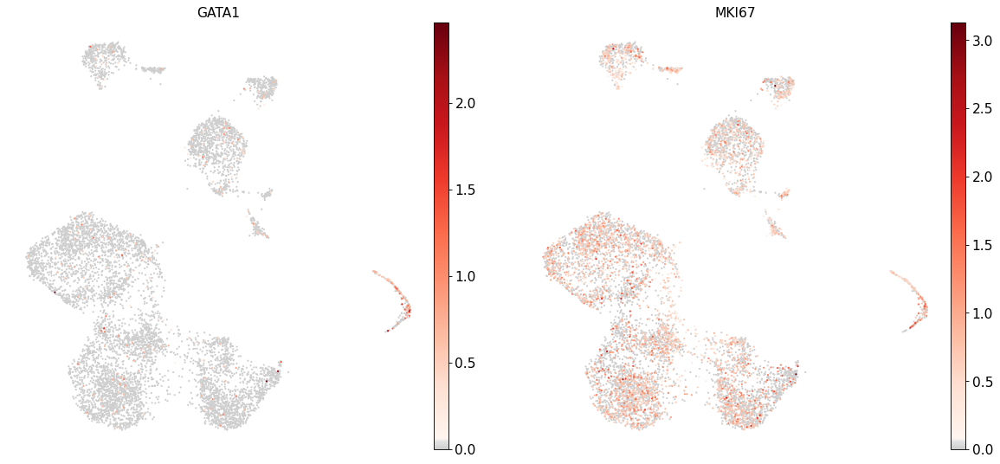

Cluster: Proerythroblast


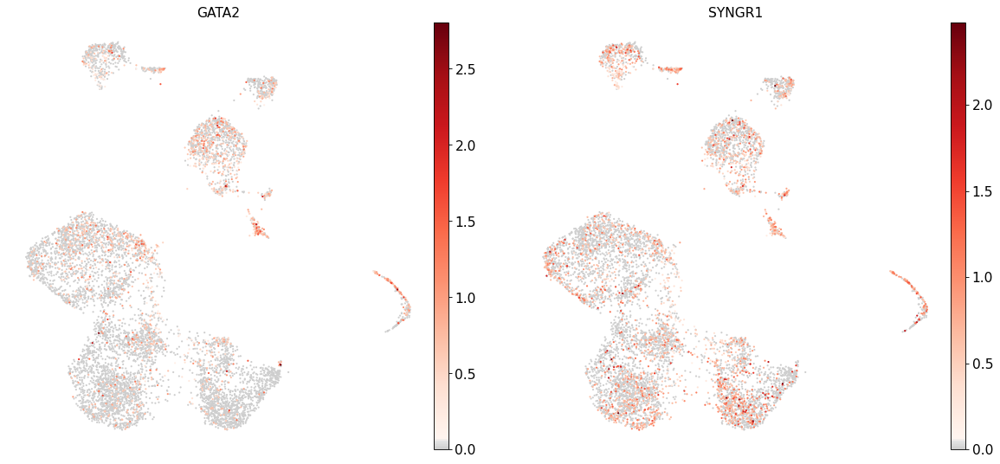

Cluster: NK


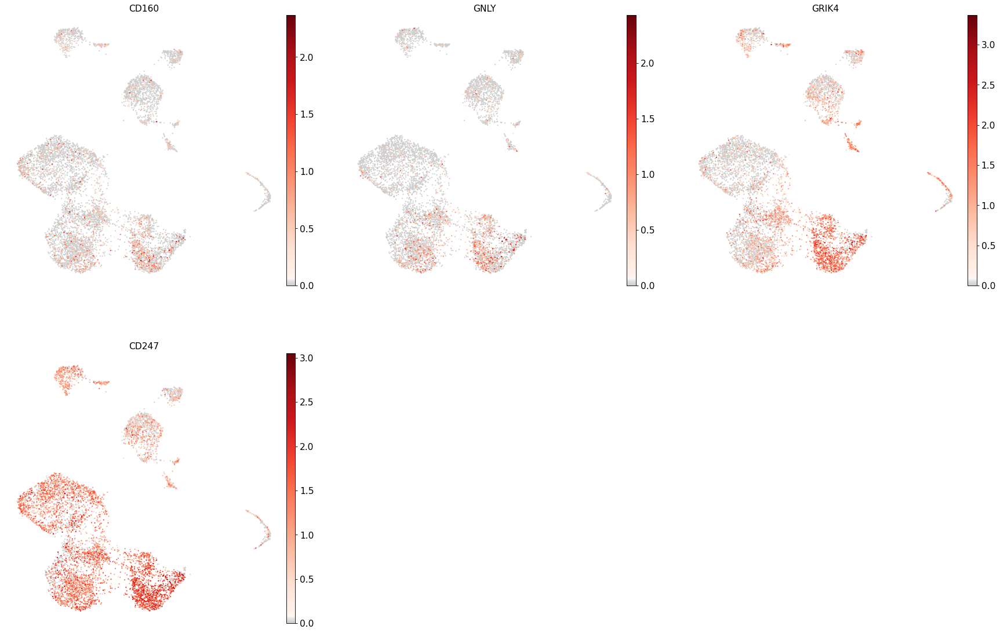

Cluster: ILC


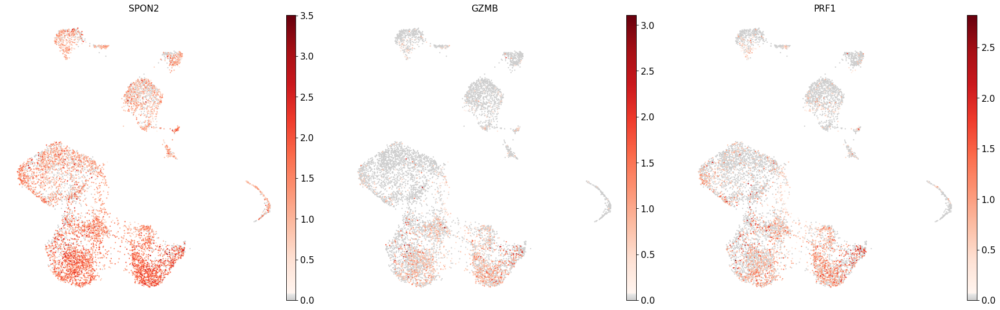

Cluster: Lymph prog


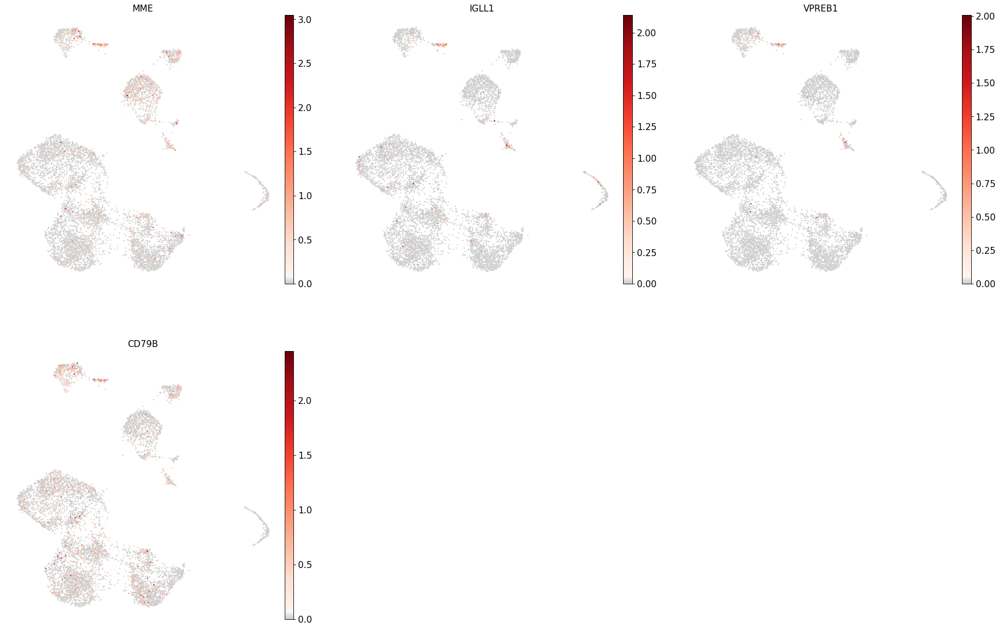

Cluster: Naive CD20+ B


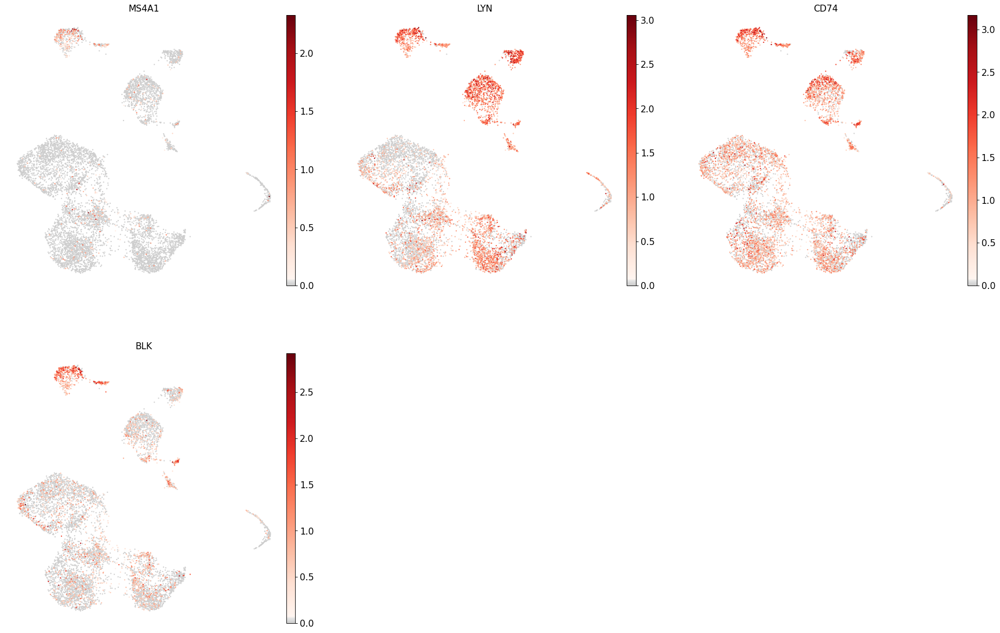

Cluster: B1 B


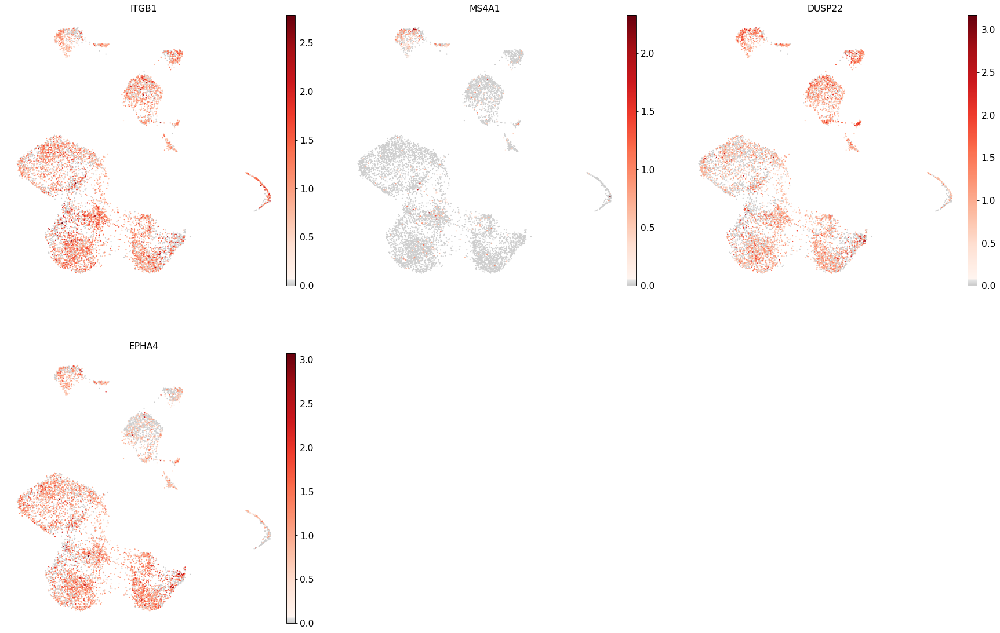

Cluster: Transitional B


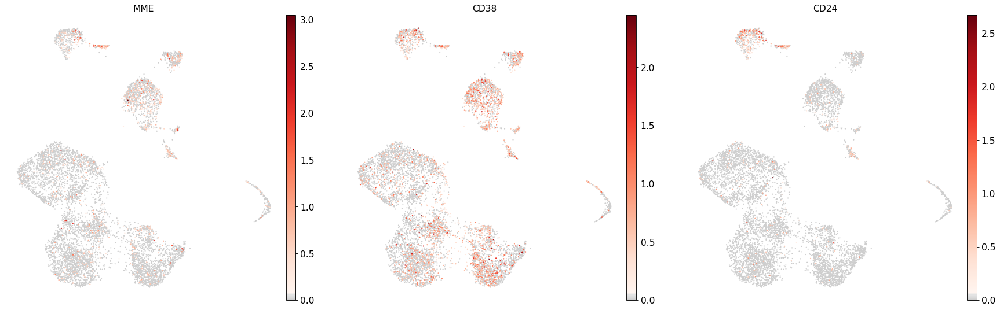

Cluster: Plasma cells


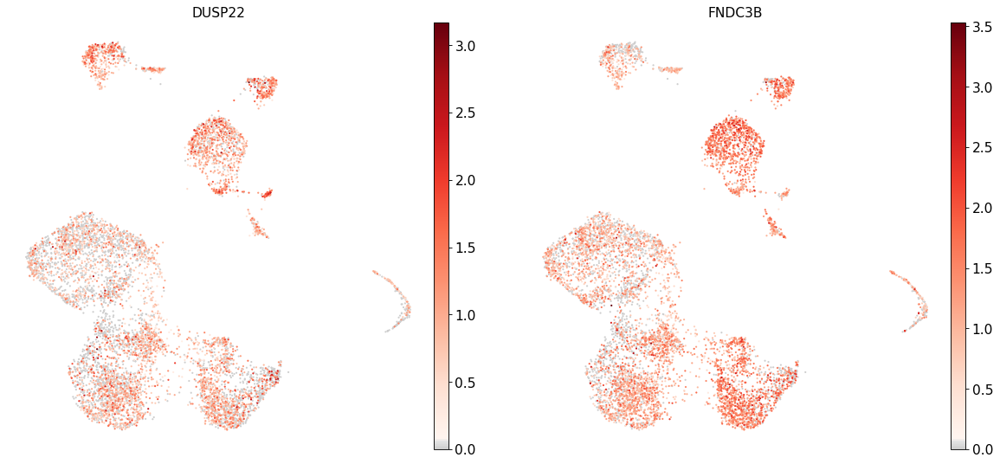

Cluster: CD4+ T activated


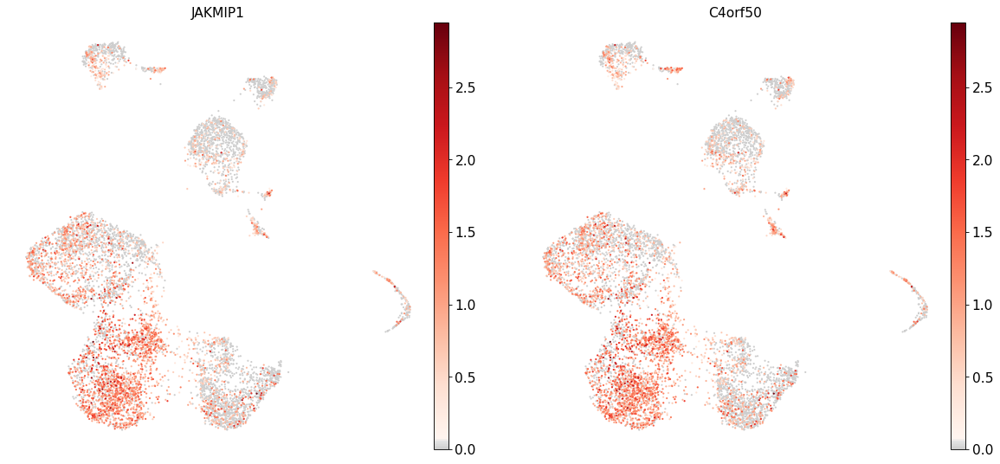

Cluster: CD4+ T naive


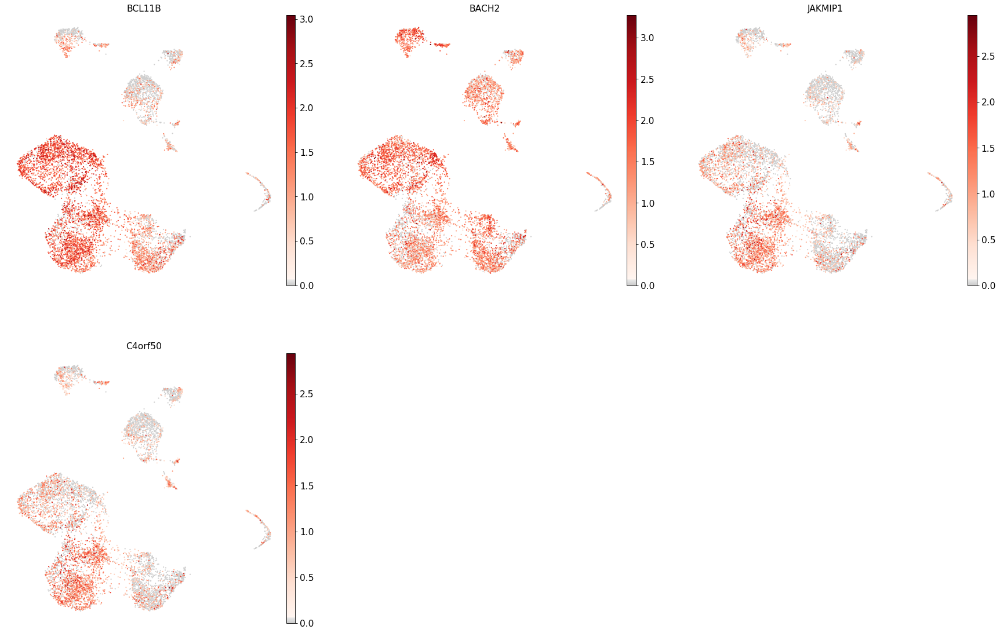

Cluster: CD8+ T


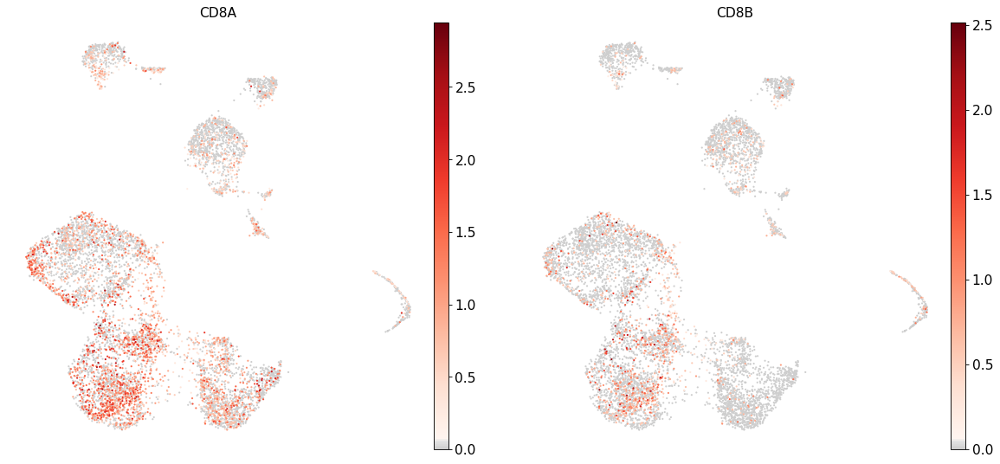

Cluster: pDCs


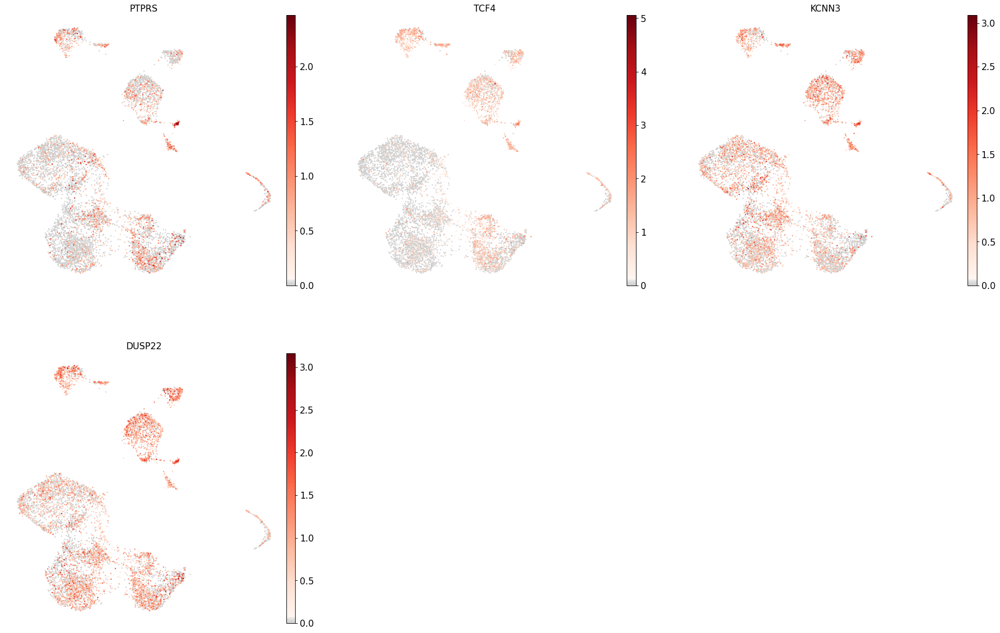

Cluster: G/M prog


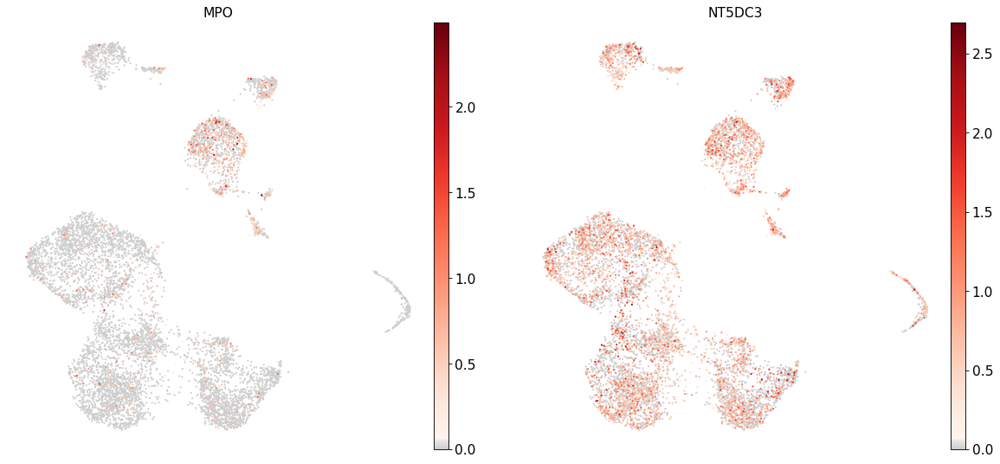

Cluster: HSC


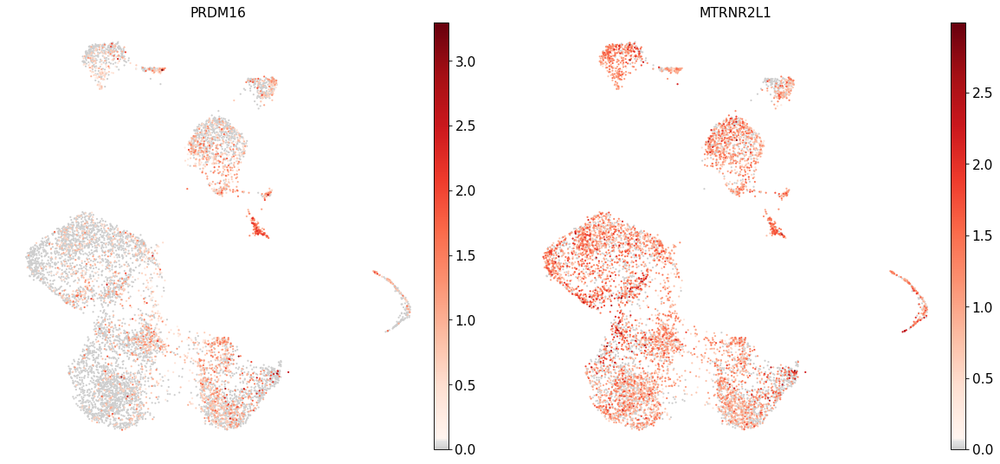

Cluster: MK/E prog


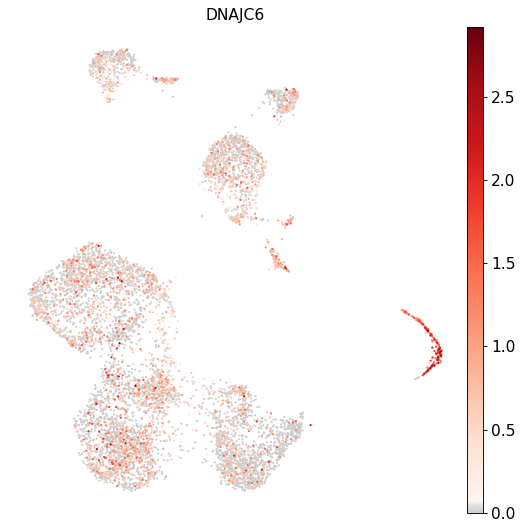

In [21]:
for i in marker_genes.keys():
    print(f'Cluster: {i}')
    genes_to_plot = [i for i in marker_genes[i] if i in adata_atac.var_names]
    sc.pl.umap(adata_atac, color=genes_to_plot, ncols=3, use_raw=False, cmap=mymap)

# Subclustering

Subclustering can be done by considering the marker genes and clustering of clear substructure in the data. Here we go through the clusters based on the major cell types identified above.


## Monocytes and DCs

In [22]:
marker_genes

{'CD14+ Mono': ['TREM1', 'FPR1'],
 'CD16+ Mono': ['LYN', 'TCF7L2'],
 'ID2-hi myeloid prog': ['KLF4'],
 'cDC2': ['TREM1', 'DMXL2'],
 'Reticulocyte': ['GATA1', 'HBA1', 'SLC4A1', 'SLC25A37', 'KLF1'],
 'Erythroblast': ['GATA1', 'MKI67'],
 'Proerythroblast': ['GATA2', 'SYNGR1'],
 'NK': ['CD160', 'GNLY', 'GRIK4', 'CD247'],
 'ILC': ['SPON2', 'GZMB', 'PRF1'],
 'Lymph prog': ['MME', 'IGLL1', 'VPREB1', 'CD79B'],
 'Naive CD20+ B': ['MS4A1', 'LYN', 'CD74', 'BLK'],
 'B1 B': ['ITGB1', 'MS4A1', 'DUSP22', 'EPHA4'],
 'Transitional B': ['MME', 'CD38', 'CD24'],
 'Plasma cells': ['DUSP22', 'FNDC3B'],
 'CD4+ T activated': ['JAKMIP1', 'C4orf50'],
 'CD4+ T naive': ['BCL11B', 'BACH2', 'JAKMIP1', 'C4orf50'],
 'CD8+ T': ['CD8A', 'CD8B'],
 'pDCs': ['PTPRS', 'TCF4', 'KCNN3', 'DUSP22'],
 'G/M prog': ['MPO', 'NT5DC3'],
 'HSC': ['PRDM16', 'MTRNR2L1'],
 'MK/E prog': ['DNAJC6']}

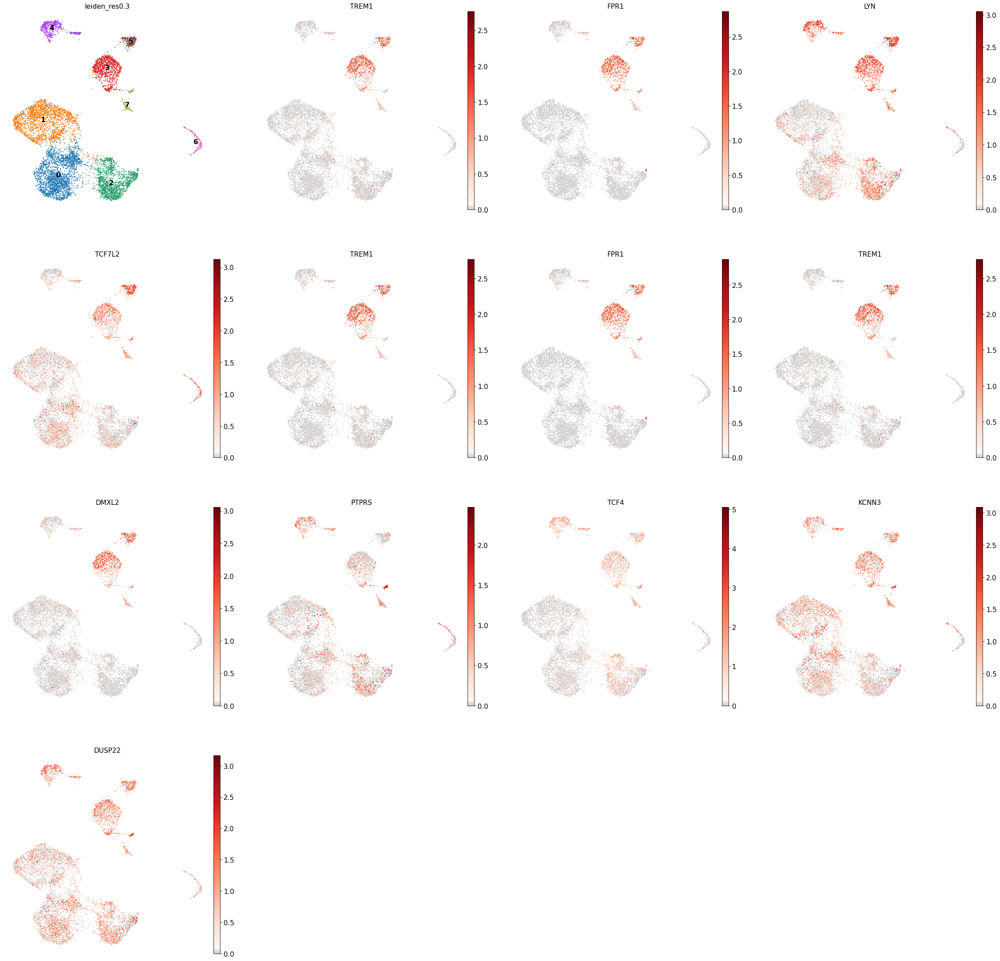

In [23]:
# Replot clusters and marker genes
sc.pl.umap(adata_atac, cmap=mymap, legend_loc = 'on data',
           color = [leiden_clus_col]+
              marker_genes['CD14+ Mono']+
              marker_genes['CD16+ Mono']+
              marker_genes['CD14+ Mono']+
              marker_genes['cDC2']+
              marker_genes['pDCs']
          )

### cluster 0

In [24]:
c_id = 0

In [25]:
# Once the resolution looks good change new_key to leiden final
orig_key = leiden_clus_col
#new_key = 'leiden_temp'
new_key = 'leiden_sub' 
new_rg_key = 'leiden_sub'
sub_key = str(c_id)

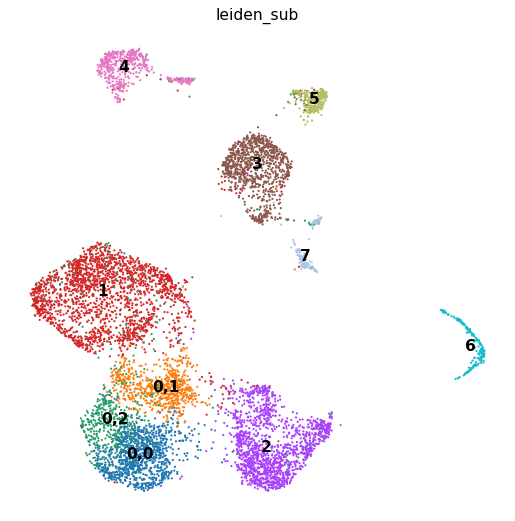

1      2015
2      1469
0,0     996
3       921
0,1     689
0,2     607
4       516
5       241
6       222
7       178
Name: leiden_sub, dtype: int64

In [26]:
res=0.2
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key, legend_loc='on data')
adata_atac.obs[new_key].value_counts()

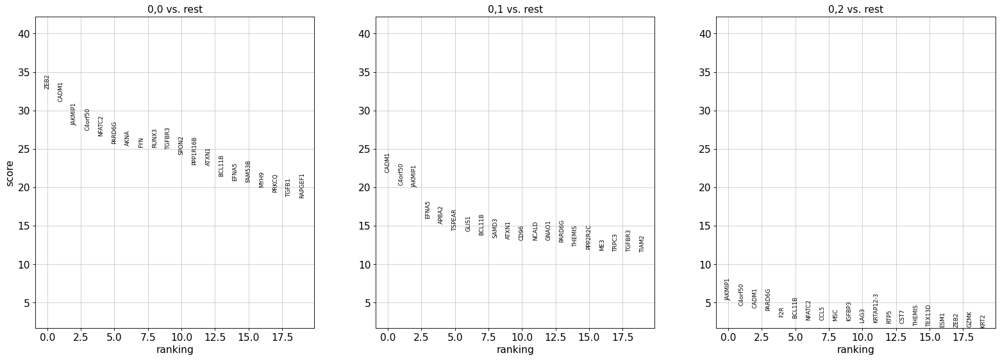

In [27]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 3

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [28]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

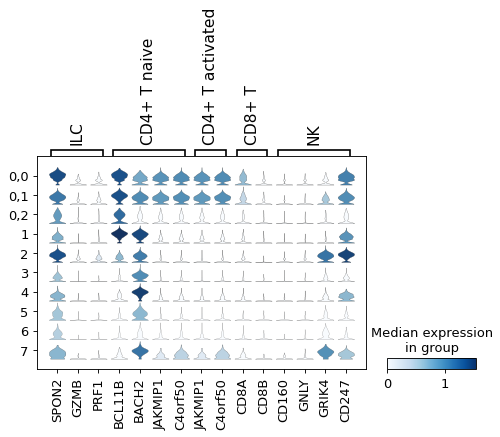

In [29]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['ILC', 'CD4+ T naive', 'CD4+ T activated', 'CD8+ T', 'NK']}, groupby=new_key)

### Summary - Cluster 0

- Cluster 0,0 CD8+ T 
- Cluster 0,1 CD8+ T 
- Cluster 0,2 CD8+ T

### cluster 1

In [30]:
c_id = 1

In [31]:
# Once the resolution looks good change new_key to leiden_sub
orig_key = 'leiden_sub'
#new_key = 'leiden_temp'
new_key = 'leiden_1sub'
new_rg_key = 'leiden_1sub'
sub_key = str(c_id)

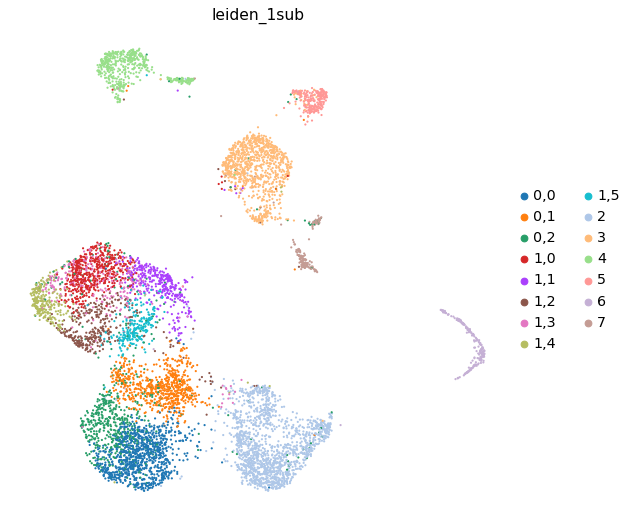

2      1469
0,0     996
3       921
0,1     689
0,2     607
1,0     528
4       516
1,1     355
1,2     337
1,3     286
1,4     266
1,5     243
5       241
6       222
7       178
Name: leiden_1sub, dtype: int64

In [32]:
res = 0.4
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key)
adata_atac.obs[new_key].value_counts()

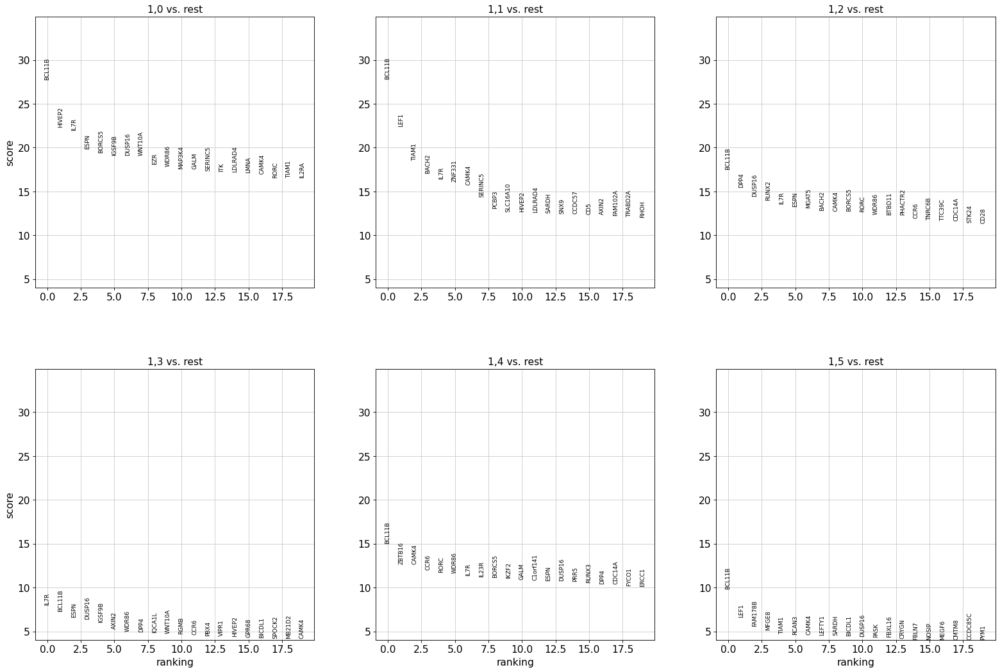

In [33]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 6

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [34]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

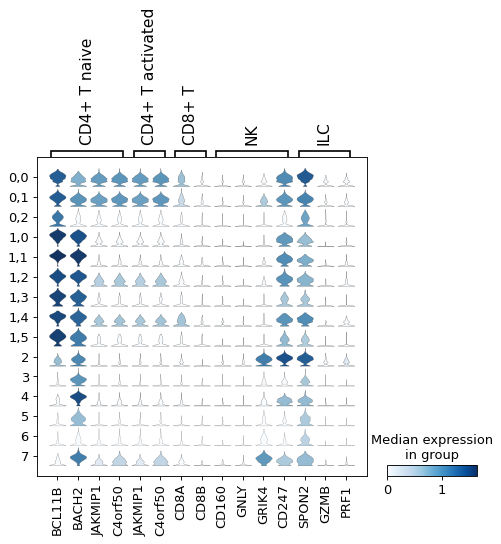

In [35]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['CD4+ T naive', 'CD4+ T activated', 'CD8+ T', 'NK', 'ILC']}, groupby=new_key)

### Summary cluster 1

- Cluster 1,0: CD4+ naive
- Cluster 1,1: CD4+ naive
- Cluster 1,2: CD4+ activated 
- Cluster 1,3: CD4+ naive
- Cluster 1,4: CD4+ activated
- Cluster 1,5: CD4+ naive

### cluster 2

In [36]:
c_id = 2

In [37]:
# Once the resolution looks good change new_key to leiden_sub
orig_key = 'leiden_1sub'
#new_key = 'leiden_temp'
new_key = 'leiden_2sub'
new_rg_key = 'leiden_2sub'
sub_key = str(c_id)

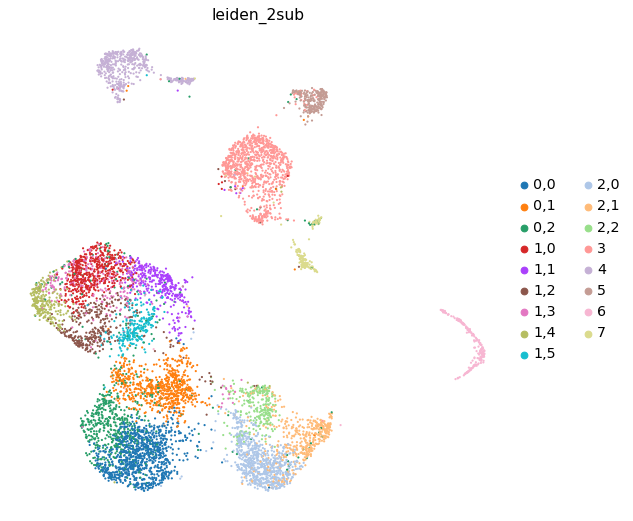

0,0    996
3      921
2,0    753
0,1    689
0,2    607
1,0    528
4      516
2,1    458
1,1    355
1,2    337
1,3    286
1,4    266
2,2    258
1,5    243
5      241
6      222
7      178
Name: leiden_2sub, dtype: int64

In [38]:
res = 0.2
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key)
adata_atac.obs[new_key].value_counts()

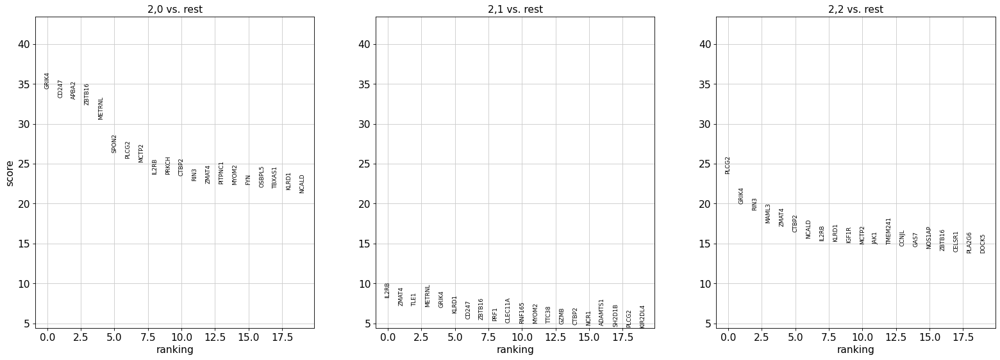

In [39]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 3

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [40]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

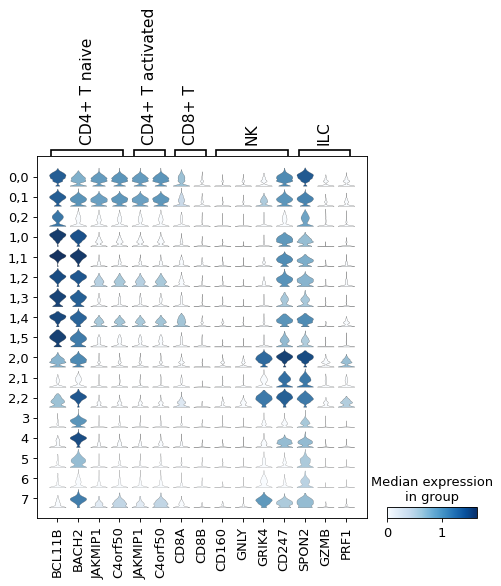

In [41]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['CD4+ T naive', 'CD4+ T activated', 'CD8+ T', 'NK', 'ILC']}, groupby=new_key)

### Summary cluster 2

- Cluster 2,0: NK
- Cluster 2,1: ILC
- Cluster 2,2: NK

### cluster 3

In [42]:
c_id = 3

In [43]:
# Initial assignment
#init_clus_dict[str(c_id)]

In [44]:
# Once the resolution looks good change new_key to leiden final
orig_key = 'leiden_2sub'
#new_key = 'leiden_temp'
new_key = 'leiden_3sub'
new_rg_key = 'leiden_3sub'
sub_key = str(c_id)

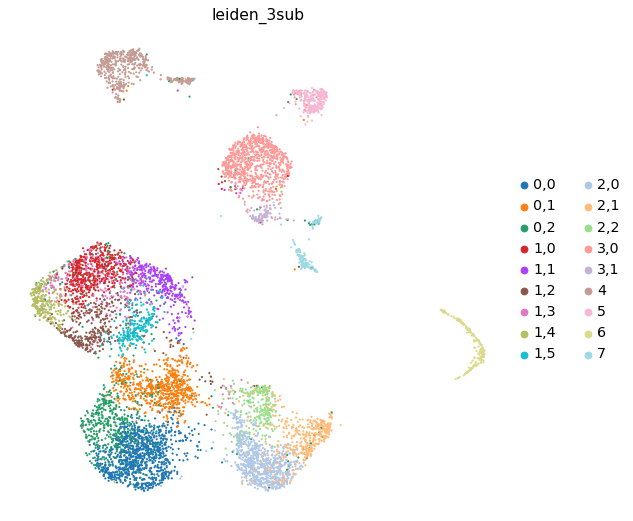

0,0    996
3,0    827
2,0    753
0,1    689
0,2    607
1,0    528
4      516
2,1    458
1,1    355
1,2    337
1,3    286
1,4    266
2,2    258
1,5    243
5      241
6      222
7      178
3,1     94
Name: leiden_3sub, dtype: int64

In [45]:
res = 0.2
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key)
adata_atac.obs[new_key].value_counts()

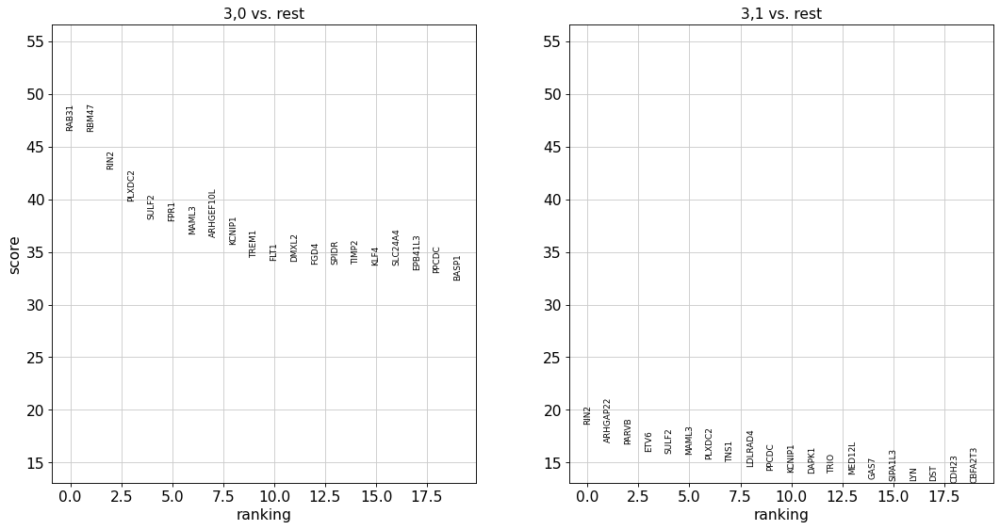

In [46]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 2

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [47]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

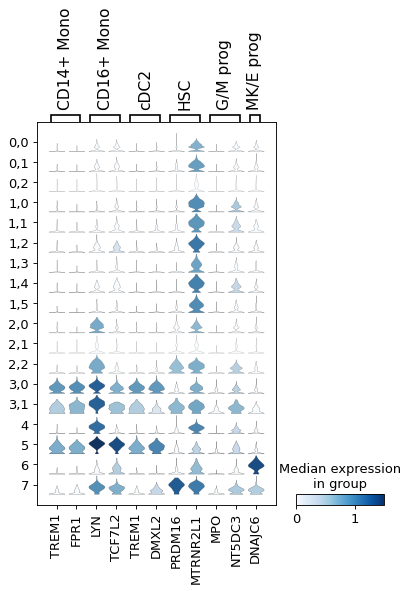

In [48]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['CD14+ Mono', 'CD16+ Mono', 'cDC2', 'HSC', 'G/M prog', 'MK/E prog']}, groupby=new_key)

### Summary cluster 3

- Cluster 3,0: CD14+ Mono
- Cluster 3,1: cDC2

### cluster 4

In [49]:
c_id = 4

In [50]:
# Initial assignment
#init_clus_dict[str(c_id)]

In [51]:
# Once the resolution looks good change new_key to leiden final
orig_key = 'leiden_3sub'
#new_key = 'leiden_temp'
new_key = 'leiden_4sub'
new_rg_key = 'leiden_4sub'
sub_key = str(c_id)

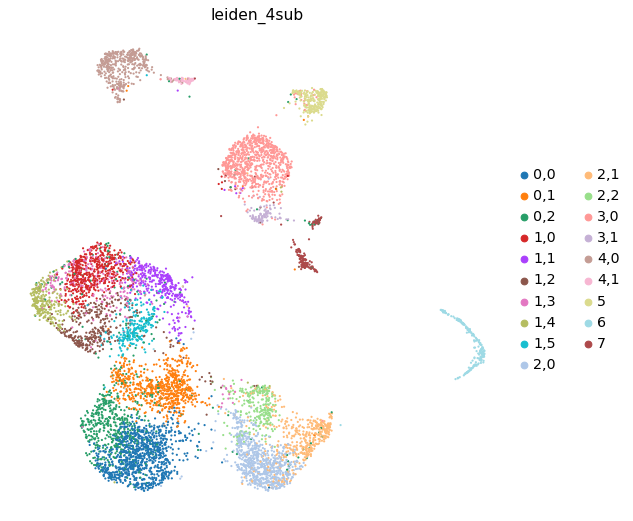

0,0    996
3,0    827
2,0    753
0,1    689
0,2    607
1,0    528
2,1    458
4,0    437
1,1    355
1,2    337
1,3    286
1,4    266
2,2    258
1,5    243
5      241
6      222
7      178
3,1     94
4,1     79
Name: leiden_4sub, dtype: int64

In [52]:
res = 0.1
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key)
adata_atac.obs[new_key].value_counts()

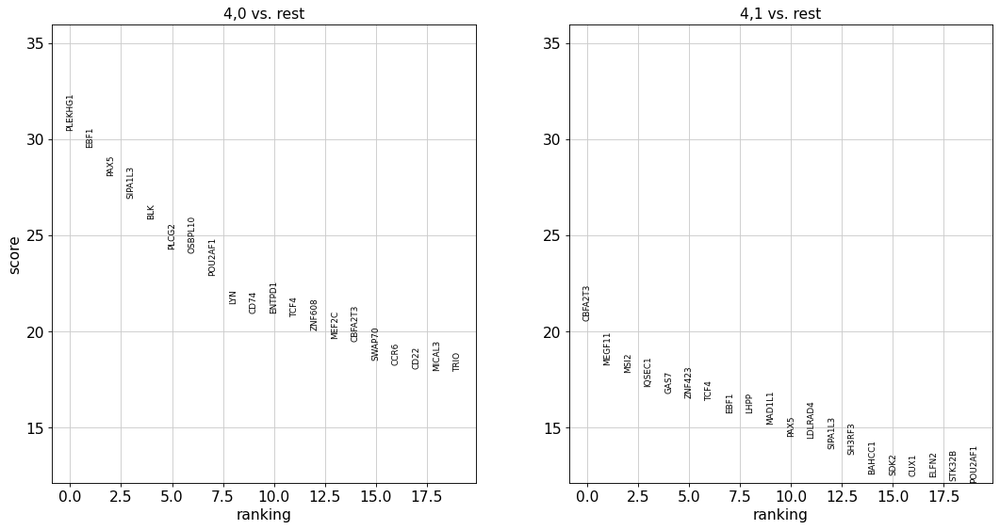

In [53]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 2

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [54]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

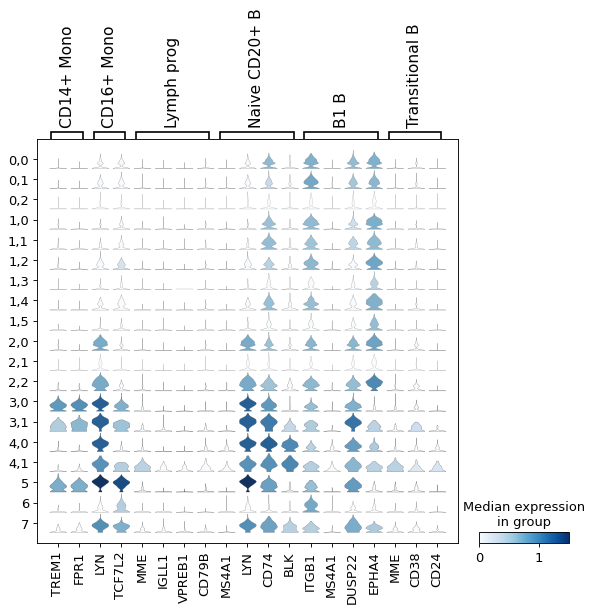

In [55]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['CD14+ Mono', 'CD16+ Mono', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B']}, groupby=new_key)

### Summary cluster 4

- Cluster 4,0: Naive CD20+ B
- Cluster 4,1: Transitional B

### cluster 5

In [56]:
c_id = 5

In [57]:
# Once the resolution looks good change new_key to leiden final
orig_key = 'leiden_4sub'
#new_key = 'leiden_temp'
new_key = 'leiden_5sub'
new_rg_key = 'leiden_5sub'
sub_key = str(c_id)

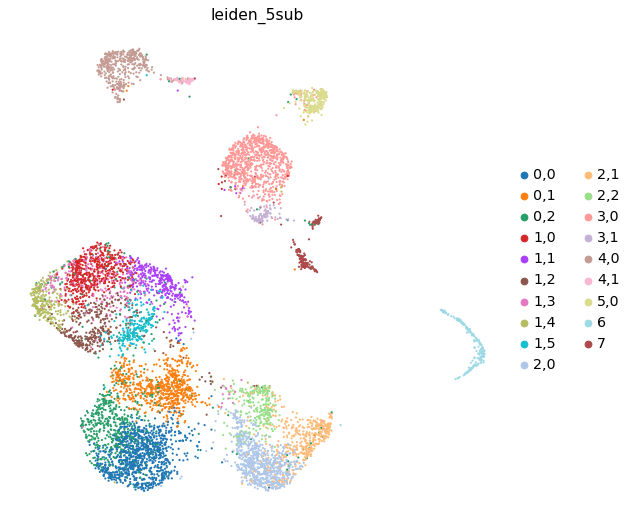

0,0    996
3,0    827
2,0    753
0,1    689
0,2    607
1,0    528
2,1    458
4,0    437
1,1    355
1,2    337
1,3    286
1,4    266
2,2    258
1,5    243
5,0    241
6      222
7      178
3,1     94
4,1     79
Name: leiden_5sub, dtype: int64

In [58]:
res = 0.1
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key)
adata_atac.obs[new_key].value_counts()

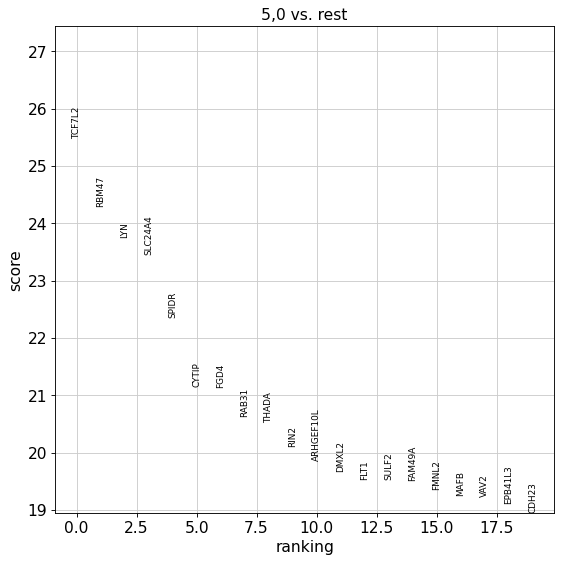

In [59]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 1

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [60]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

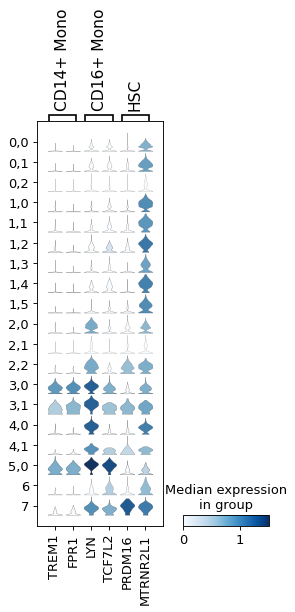

In [61]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['CD14+ Mono', 'CD16+ Mono', 'HSC']}, groupby=new_key)

### Summary cluster 5
- Cluster 5: CD16+ Mono

### cluster 6

In [62]:
c_id = 6

In [63]:
# Initial assignment
#init_clus_dict[str(c_id)]

In [64]:
# Once the resolution looks good change new_key to leiden final
orig_key = 'leiden_5sub'
#new_key = 'leiden_temp'
new_key = 'leiden_6sub'
new_rg_key = 'leiden_6sub'
sub_key = str(c_id)

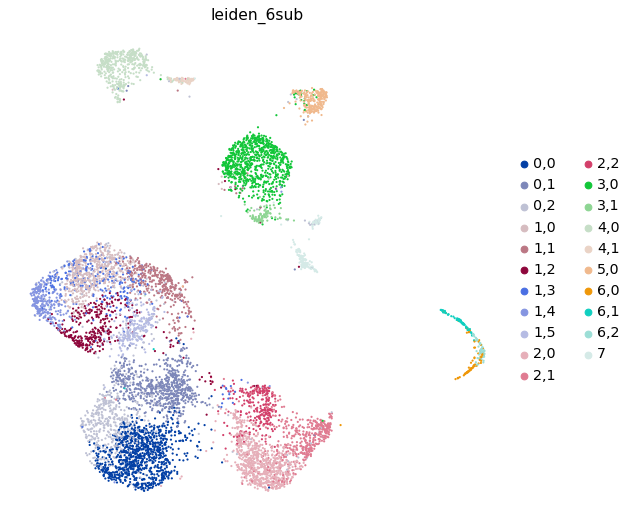

0,0    996
3,0    827
2,0    753
0,1    689
0,2    607
1,0    528
2,1    458
4,0    437
1,1    355
1,2    337
1,3    286
1,4    266
2,2    258
1,5    243
5,0    241
7      178
3,1     94
6,0     83
4,1     79
6,1     79
6,2     60
Name: leiden_6sub, dtype: int64

In [65]:
res = 0.15
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key)
adata_atac.obs[new_key].value_counts()

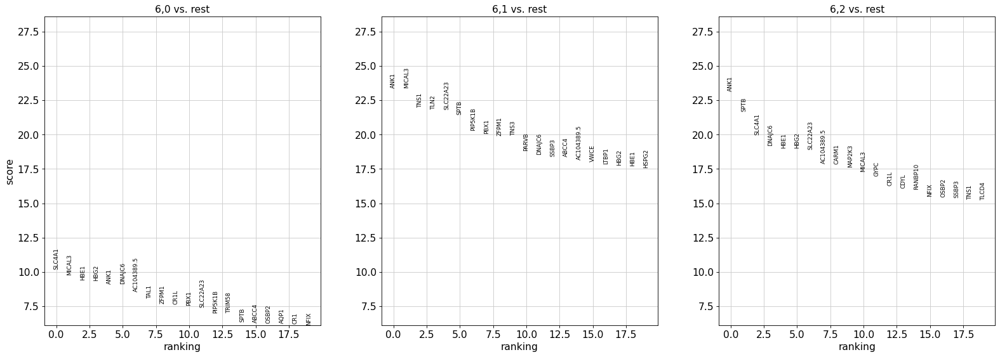

In [66]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 3

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [67]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

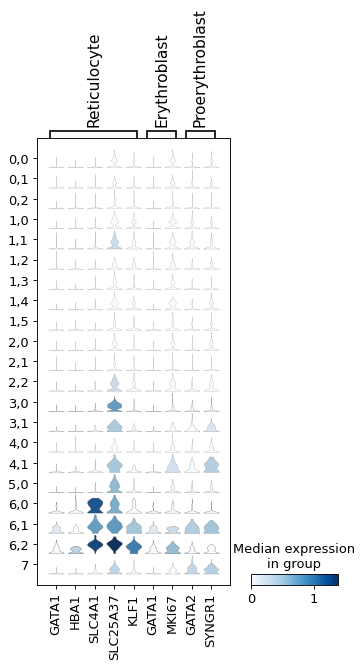

In [68]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['Reticulocyte', 'Erythroblast', 'Proerythroblast']}, groupby=new_key)

### Summary cluster 6
- Cluster 6,0: reticulocyte
- Cluster 6,1: proerythroblast
- Cluster 6,2: erythroblast

### cluster 7

In [69]:
c_id = 7

In [70]:
# Initial assignment
#init_clus_dict[str(c_id)]

In [71]:
# Once the resolution looks good change new_key to leiden final
orig_key = 'leiden_6sub'
#new_key = 'leiden_temp'
new_key = 'leiden_7sub'
new_rg_key = 'leiden_7sub'
sub_key = str(c_id)

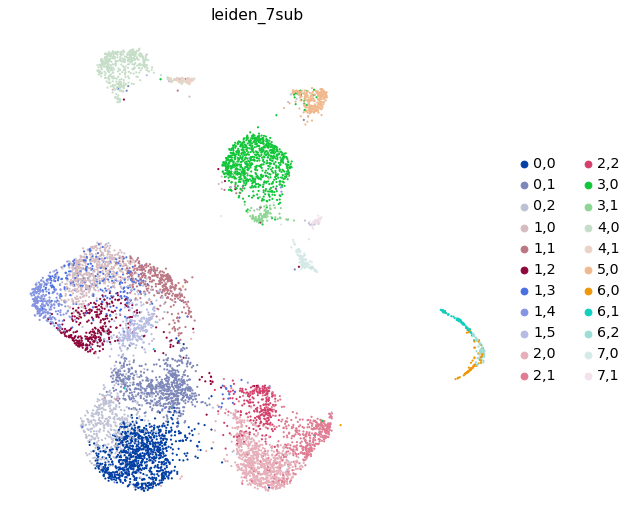

0,0    996
3,0    827
2,0    753
0,1    689
0,2    607
1,0    528
2,1    458
4,0    437
1,1    355
1,2    337
1,3    286
1,4    266
2,2    258
1,5    243
5,0    241
7,0    125
3,1     94
6,0     83
4,1     79
6,1     79
6,2     60
7,1     53
Name: leiden_7sub, dtype: int64

In [72]:
res = 0.15
sc.tl.leiden(adata_atac, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_atac, color=new_key)
adata_atac.obs[new_key].value_counts()

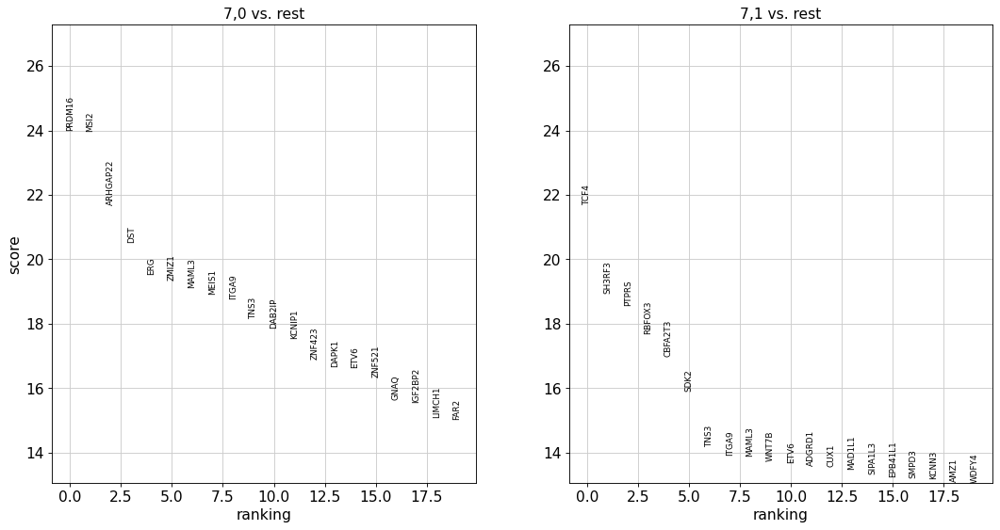

In [73]:
# Check markers of subclusters

#set number of clusters
num_subclusts = 2

new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_atac, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_atac, key=new_rg_key, groups=new_groups, ncols=3)

In [74]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

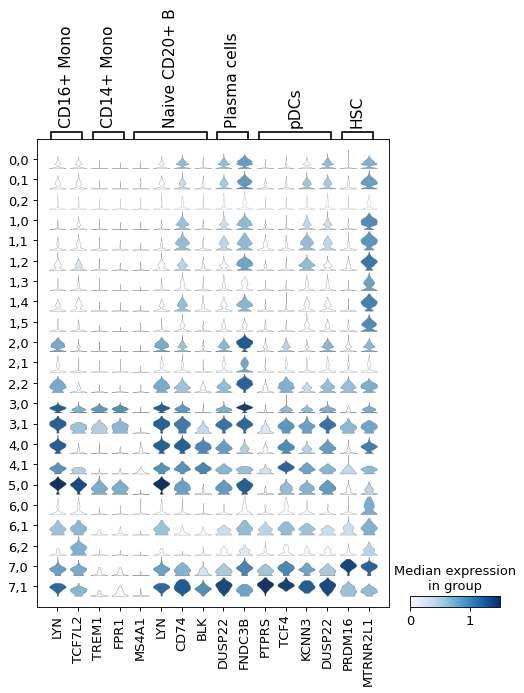

In [75]:
sc.pl.stacked_violin(adata_atac, var_names={a:marker_genes[a] for a in ['CD16+ Mono', 'CD14+ Mono', 'Naive CD20+ B', 'Plasma cells', 'pDCs', 'HSC']}, groupby=new_key)

### Summary cluster 7
- Cluster 7,0: HSC
- Cluster 7,1: pDCs

## Final annotation

In [76]:
adata_atac_filt = adata_atac.copy()

In [77]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC2', 'Reticulocyte', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog'])

In [78]:
# Merge cluster 0,0 0,1 0,2 subclusters (CD8+ T)
adata_atac_filt.obs['leiden_final'] = ['0' if c in ['0,0', '0,1', '0,2'] else c for c in adata_atac_filt.obs['leiden_7sub']]
adata_atac_filt.obs['leiden_final'] = adata_atac_filt.obs['leiden_final'].astype('category')
adata_atac_filt.obs['leiden_final'].cat.categories
adata_atac_filt.obs['leiden_final'].value_counts()

0      2292
3,0     827
2,0     753
1,0     528
2,1     458
4,0     437
1,1     355
1,2     337
1,3     286
1,4     266
2,2     258
1,5     243
5,0     241
7,0     125
3,1      94
6,0      83
6,1      79
4,1      79
6,2      60
7,1      53
Name: leiden_final, dtype: int64

In [79]:
# Merge cluster 1,0 1,1 1,3 1,5 subclusters (CD4+ T naive)
adata_atac_filt.obs['leiden_final'] = ['1,0 1,1 1,3 1,5' if c in ['1,0', '1,1', '1,3', '1,5'] else c for c in adata_atac_filt.obs['leiden_final']]
adata_atac_filt.obs['leiden_final'] = adata_atac_filt.obs['leiden_final'].astype('category')
adata_atac_filt.obs['leiden_final'].cat.categories
adata_atac_filt.obs['leiden_final'].value_counts()

0                  2292
1,0 1,1 1,3 1,5    1412
3,0                 827
2,0                 753
2,1                 458
4,0                 437
1,2                 337
1,4                 266
2,2                 258
5,0                 241
7,0                 125
3,1                  94
6,0                  83
6,1                  79
4,1                  79
6,2                  60
7,1                  53
Name: leiden_final, dtype: int64

In [80]:
# Merge cluster 2,0 2,2 subclusters (NK)
adata_atac_filt.obs['leiden_final'] = ['2,0 2,2' if c in ['2,0', '2,2'] else c for c in adata_atac_filt.obs['leiden_final']]
adata_atac_filt.obs['leiden_final'] = adata_atac_filt.obs['leiden_final'].astype('category')
adata_atac_filt.obs['leiden_final'].cat.categories
adata_atac_filt.obs['leiden_final'].value_counts()

0                  2292
1,0 1,1 1,3 1,5    1412
2,0 2,2            1011
3,0                 827
2,1                 458
4,0                 437
1,2                 337
1,4                 266
5,0                 241
7,0                 125
3,1                  94
6,0                  83
4,1                  79
6,1                  79
6,2                  60
7,1                  53
Name: leiden_final, dtype: int64

In [81]:
# Merge cluster 2,0 2,2 subclusters (CD4+ activated)
adata_atac_filt.obs['leiden_final'] = ['1,2 1,4' if c in ['1,2', '1,4'] else c for c in adata_atac_filt.obs['leiden_final']]
adata_atac_filt.obs['leiden_final'] = adata_atac_filt.obs['leiden_final'].astype('category')
adata_atac_filt.obs['leiden_final'].cat.categories
adata_atac_filt.obs['leiden_final'].value_counts()

0                  2292
1,0 1,1 1,3 1,5    1412
2,0 2,2            1011
3,0                 827
1,2 1,4             603
2,1                 458
4,0                 437
5,0                 241
7,0                 125
3,1                  94
6,0                  83
4,1                  79
6,1                  79
6,2                  60
7,1                  53
Name: leiden_final, dtype: int64

In [82]:
rename_clust_dict = {
    '0':'CD8+ T',
    '1,0 1,1 1,3 1,5': 'CD4+ T naive',
    '2,0 2,2':'NK',
    '3,0':'CD14+ Mono', 
    '1,2 1,4':'CD4+ T activated', 
    '2,1':'ILC',
    '4,0':'Naive CD20+ B',
    '5,0':'CD16+ Mono',
    '7,0':'HSC',
    '3,1':'cDC2',
    '6,0':'Reticulocyte',
    '4,1':'Transitional B',
    '6,1':'Proerythroblast',
    '6,2':'Erythroblast',
    '7,1':'pDCs'
}

In [83]:
# Note: this must be done in the same order as the categories above!
adata_atac_filt.rename_categories('leiden_final', [rename_clust_dict[ct] for ct in adata_atac_filt.obs['leiden_final'].cat.categories])

In [84]:
adata_atac_filt.obs['leiden_final'] = adata_atac_filt.obs['leiden_final'].cat.reorder_categories(['CD14+ Mono', 'CD16+ Mono', 'pDCs', 'cDC2', 'Naive CD20+ B',
                            'Transitional B','HSC', 'Proerythroblast', 'Erythroblast', 'Reticulocyte', 'CD4+ T naive', 'CD4+ T activated', 'CD8+ T', 'NK', 'ILC'])

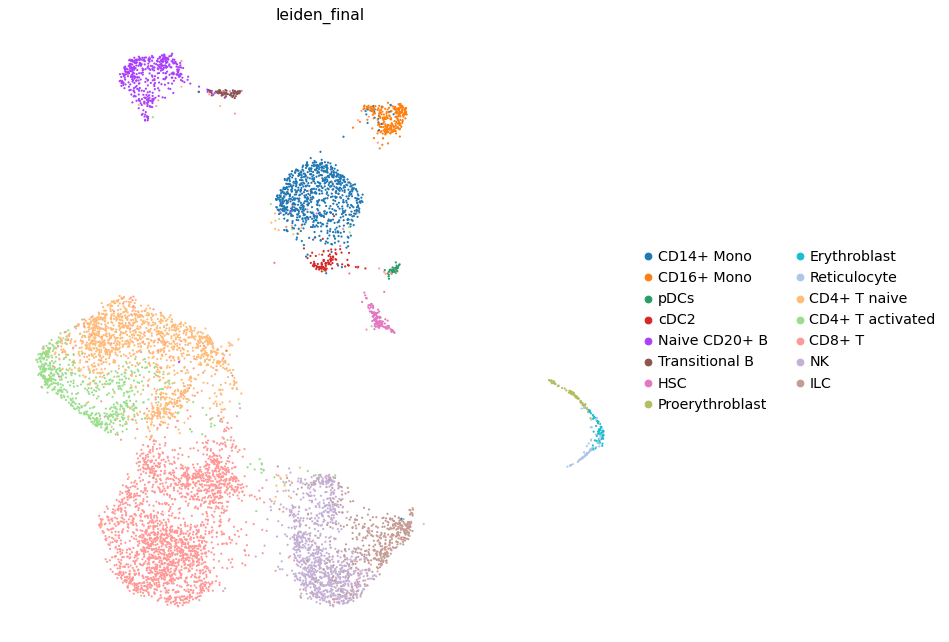

In [85]:
plt.rcParams['figure.figsize'] = (10,10)
sc.pl.umap(adata_atac_filt, color='leiden_final')
plt.rcParams['figure.figsize'] = (8,8)

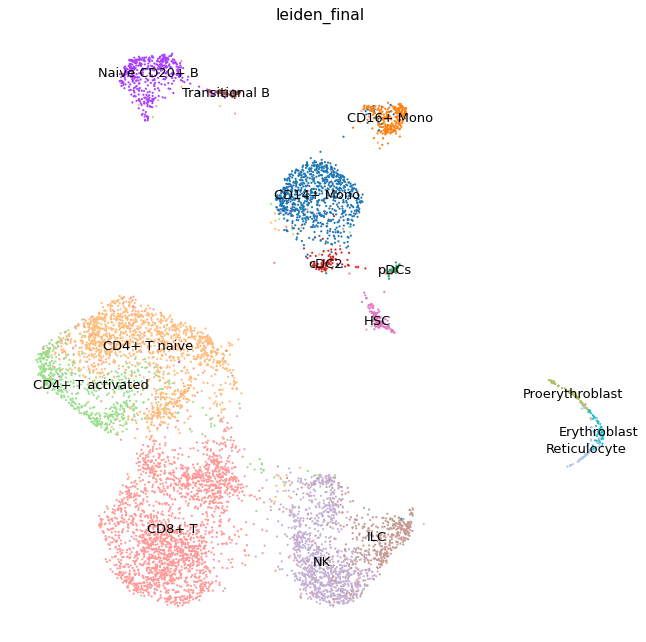

In [86]:
plt.rcParams['figure.figsize'] = (10,10)
sc.pl.umap(adata_atac_filt, color='leiden_final', legend_loc='on data', legend_fontsize='small', legend_fontweight='light')

In [87]:
#Overview
adata_plot = adata_atac.copy()
sc.pp.scale(adata_plot, max_value=4)

In [88]:
marker_genes_updated = marker_genes

## Write output

In [106]:
adata_atac = adata_atac_filt

In [107]:
adata_atac_slim = adata_atac.copy()

In [108]:
adata_atac_slim.write_h5ad('/home/jovyan/project/s1d2_data/s1d2_atac_not_tidy.h5ad')

In [109]:
adata_atac_slim

AnnData object with n_obs × n_vars = 7854 × 19039
    obs: 'nCount_peaks', 'atac_fragments', 'TSS.enrichment', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'leiden_res0.3', 'leiden_res0.5', 'leiden_res0.8', 'leiden_res1', 'leiden_sub', 'leiden_1sub', 'leiden_2sub', 'leiden_3sub', 'leiden_4sub', 'leiden_5sub', 'leiden_6sub', 'leiden_7sub', 'leiden_final'
    uns: 'peak_names', 'neighbors', 'leiden', 'leiden_res0.3_colors', 'leiden_res0.5_colors', 'leiden_res0.8_colors', 'leiden_res1_colors', 'rank_genes_res0.3', 'leiden_sub_colors', 'leiden_sub', 'leiden_1sub_colors', 'leiden_1sub', 'leiden_2sub_colors', 'leiden_2sub', 'leiden_3sub_colors', 'leiden_3sub', 'leiden_4sub_colors', 'leiden_4sub', 'leiden_5sub_colors', 'leiden_5sub', 'leiden_6sub_colors', 'leiden_6sub', 'leiden_7sub_colors', 'leiden_7sub', 'leiden_final_colors'
    obsm: 'lsi_full', 'lsi_red', 'peaks', 'umap'
    obsp: 'distances', 'connectivities'

In [110]:
adata_atac_slim.obs = adata_atac.obs[['nCount_peaks','atac_fragments',
                                     'reads_in_peaks_frac','blacklist_fraction','nucleosome_signal',
                                     'leiden_final']]
del adata_atac_slim.uns
adata_atac_slim.uns['neighbors'] = adata_atac.uns['neighbors']
adata_atac_slim.uns['peak_names'] = adata_atac.uns['peak_names']

In [111]:
adata_atac_slim

AnnData object with n_obs × n_vars = 7854 × 19039
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'leiden_final'
    uns: 'neighbors', 'peak_names'
    obsm: 'lsi_full', 'lsi_red', 'peaks', 'umap'
    obsp: 'distances', 'connectivities'

In [112]:
adata_atac_slim.write_h5ad('/home/jovyan/project/s1d2_data/s1d2_atac.h5ad')

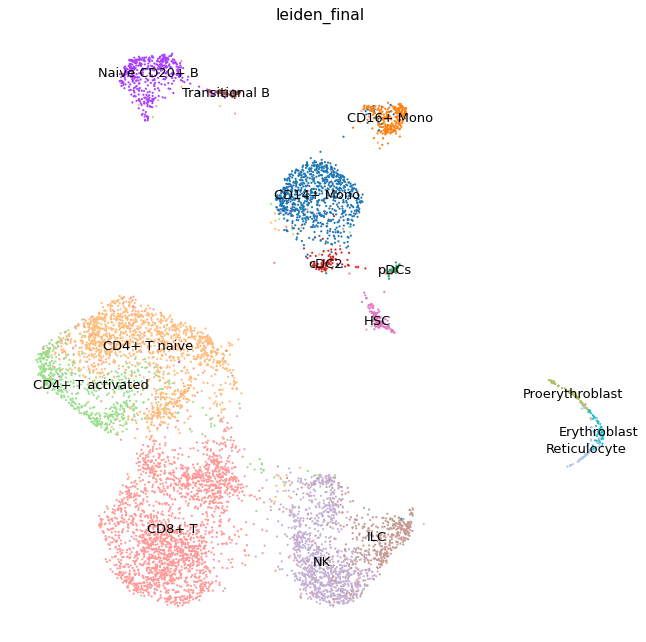

In [113]:
plt.rcParams['figure.figsize'] = (10,10)
sc.pl.umap(adata_atac_slim, color='leiden_final', legend_loc='on data', legend_fontsize='small', legend_fontweight='light')